In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import torch
import torch.nn as nn
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix
from sklearn.multiclass import OneVsOneClassifier
import pandas as pd
import seaborn as sns


import warnings
warnings.filterwarnings("ignore")

In [4]:
df=pd.read_csv('mobile_price.csv')
X,y= df.iloc[ :,:-1], df.iloc[:, -1]
X.shape

(2000, 20)

In [5]:
def plot_decision_boundary(X, y, model, resolution=0.02):
    colors = ['red', 'blue', 'lightgreen', 'gray', 'cyan']
    cmap = ListedColormap(colors[:len(np.unique(y))])
    markers = ('s', 'x', 'o', '^', 'v')      
    
    x_min, x_max = X[:,0].min()-1, X[:,0].max()+1
    y_min, y_max = X[:,1].min()-1, X[:,1].max()+1

    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution), np.arange(y_min, y_max, resolution))

    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(xx, yy, Z, alpha=0.3, cmap=cmap)
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())


    for idx, cl in enumerate(np.unique(y)): 
        plt.scatter(X[y==cl, 0], X[y==cl, 1],  color=cmap(idx),edgecolors='k',marker=markers[idx],label=cl)


In [6]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)
sc=StandardScaler()

X_train=sc.fit_transform(X_train)
X_test=sc.transform(X_test)

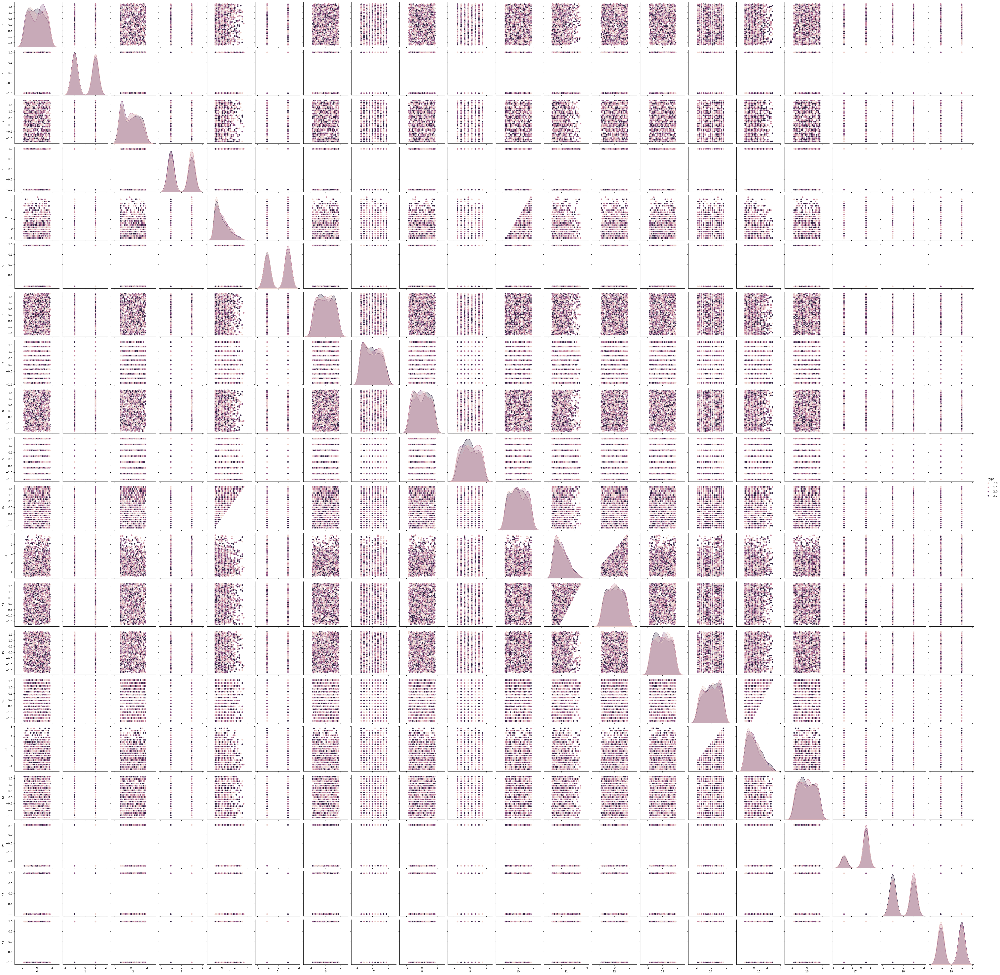

In [11]:
df = pd.DataFrame(data=X_train)
df['type'] = pd.DataFrame(data=y_train)
sns.pairplot(df, hue="type")
plt.show()

In [68]:
X2_train=X_train[:,[5,11]]
y2_train=y_train
X2_test=X_test[:,[5,11]]
y2_test=y_test

In [69]:
n_samples, n_features = X2_train.shape

lr=0.7
n_epoch=10000

In [70]:
class MultiClassLogisticRegression:
    
    def __init__(self, n_epoch = 10000, lr=0.1, thres=0.001):
        self.n_epoch = n_epoch
        self.thres = thres
        self.lr=lr
        self.weights=None
        self.bias=None

    def __onehot__(self, y):
        classes = np.unique(y)
        y = np.eye(len(classes))[y]
        return y

    def __softmax__(self, z):
        return np.exp(z) / np.sum(np.exp(z), axis=1).reshape(-1,1)

    def __cross_entropy__(self, a, y):
        return -1 * np.mean(y * np.log(a))

    def __forward__(self, X):
        z=np.dot(X, self.weights)+self.bias
        a=self.__softmax__(z)
        return z,a
    
    def fit(self, X, y): 
        n_class=len(np.unique(y))
        n_samples, n_feat = X.shape
        self.weights= np.zeros(( n_feat, n_class))
        self.bias=np.zeros(n_class)

        for i in range(self.n_epoch):
            y_hot=self.__onehot__(y)

            z, a = self.__forward__(X)

            dw=-np.dot((y_hot-a).T, X).T/X.shape[0]
            db=-(y_hot-a).mean(axis=0)
            
            if np.abs(dw).max() < self.thres: break
                
            self.weights = self.weights - self.lr*dw
            self.bias = self.bias - self.lr*db
            
            loss=np.mean(self.__cross_entropy__(a,y_hot))

            if (i+1)%1000 == 0:
                print(f'Epoch = {(i+1)}:, Loss: {loss:.03f}')

    
    def predict(self, X):

        _, a=self.__forward__(X)
        return np.argmax(a, axis=1)
      
    def score(self, X, y):
        return np.mean(self.predict(X) == y)

In [71]:
model= MultiClassLogisticRegression(n_epoch,lr)

In [72]:
model.fit(X2_train, y2_train)

In [73]:
print('Weights: ' ,model.weights)
print('bias: ',model.bias)

Weights:  [[-0.03960253  0.02601367 -0.04044744  0.0540363 ]
 [-0.2582682   0.03041074 -0.00565903  0.23351649]]
bias:  [-0.00392413  0.02867072 -0.00913159 -0.01561501]


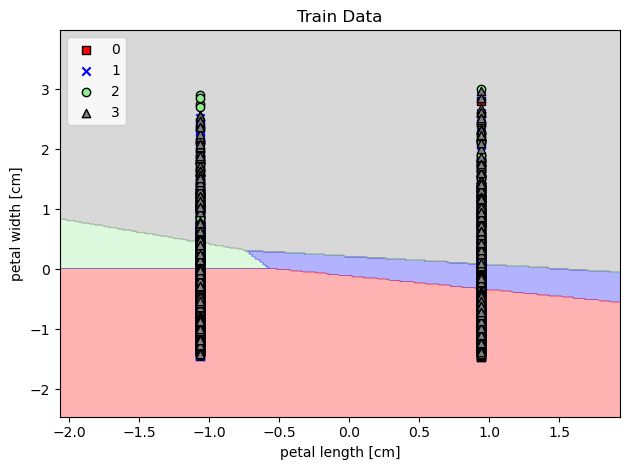

Accuracy =  0.3


In [74]:
plot_decision_boundary(X2_train, y2_train, model)
plt.legend(loc='upper left')
plt.title("Train Data")
plt.xlabel('petal length [cm]')
plt.ylabel('petal width [cm]')
plt.tight_layout()
plt.show()
print("Accuracy = ", model.score(X2_train, y2_train))